# Plotting Data (MODIS and VIIRS) for one year. How wildfire change over the course of a year

In [ ]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px

In [ ]:
df_modis = pd.read_csv("fire_archive_M-C61_280974.csv")

In [ ]:
df_modis.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,19.3440,-155.0140,312.1,1.9,1.3,2013-01-01,6,Aqua,MODIS,0,6.03,293.7,18.0,D,1
1,33.0029,-110.7696,305.4,1.7,1.3,2013-01-01,856,Aqua,MODIS,64,6.03,272.1,26.3,N,2
2,19.3370,-155.0071,346.1,1.2,1.1,2013-01-01,1217,Aqua,MODIS,100,6.03,303.2,68.8,N,3
3,19.3406,-155.0297,329.1,1.2,1.1,2013-01-01,1217,Aqua,MODIS,100,6.03,295.8,37.6,N,1
4,19.3411,-155.0122,361.1,1.2,1.1,2013-01-01,1217,Aqua,MODIS,100,6.03,305.2,114.5,N,1


In [ ]:
print("unique values:")
print(df_modis.satellite.unique())
print(df_modis.instrument.unique())
print(df_modis.acq_time.unique())
print(df_modis.daynight.unique())

print(df_modis['type'].unique())

unique values:
['Aqua' 'Terra']
['MODIS']
[   6  856 1217 ...  341 1123 1052]
['D' 'N']
[1 2 3 0]


In [ ]:
print(df_modis.acq_date.unique())

In [ ]:
print("Start date",min(df_modis['acq_date']),"| End date:",max(df_modis['acq_date']))

Start date 2013-01-01 | End date: 2013-12-31


In [ ]:
df1 = df_modis.sort_values(by = ['acq_date'],ascending = True)

fig = px.density_mapbox(df1, lon = 'longitude', lat = 'latitude',z = 'brightness', 
                        radius = 8,
                        center = dict(lon = -97,lat = 40),
                        zoom = 2.4,
                        mapbox_style='carto-positron',
                        color_continuous_scale = 'reds',
                        animation_frame = 'acq_date',
                        labels = {"acq_date":"Date"})

fig.update_layout(title = 'MODIS | US Fires: From 2013-01-01 to 2013-12-31',
                  title_font = dict(size = 18,color = 'FireBrick'),
                  title_x = 0.5)

fig.show()

# Plotting With VIIRS

In [ ]:
df_VIRRS = pd.read_csv("fire_archive_SV-C2_280972.csv")
df1 = df_modis.sort_values(by = ['acq_date'],ascending = True)

fig = px.density_mapbox(df1, lon = 'longitude', lat = 'latitude',z = 'brightness', 
                        radius = 8,
                        center = dict(lon = -97,lat = 40),
                        zoom = 2.4,
                        mapbox_style='carto-positron',
                        color_continuous_scale = 'reds',
                        animation_frame = 'acq_date',
                        labels = {"acq_date":"Date"})

fig.update_layout(title = 'VIIRS | US Fires: From 2013-01-01 to 2013-12-31',
                  title_font = dict(size = 18,color = 'FireBrick'),
                  title_x = 0.5)

fig.show()

In [ ]:
df_VIRRS.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,28.966951,-81.738235,296.46,0.59,0.70,2013-01-01,612,N,VIIRS,n,1,281.78,0.73,N,0
1,33.015182,-79.886269,302.35,0.50,0.66,2013-01-01,612,N,VIIRS,n,1,279.78,1.45,N,2
2,41.480541,-90.832298,321.17,0.39,0.36,2013-01-01,748,N,VIIRS,n,1,262.67,2.43,N,2
3,46.731281,-92.076927,302.25,0.46,0.39,2013-01-01,748,N,VIIRS,n,1,257.34,1.33,N,3
4,29.535870,-91.341080,331.74,0.40,0.37,2013-01-01,754,N,VIIRS,n,1,269.36,3.05,N,0


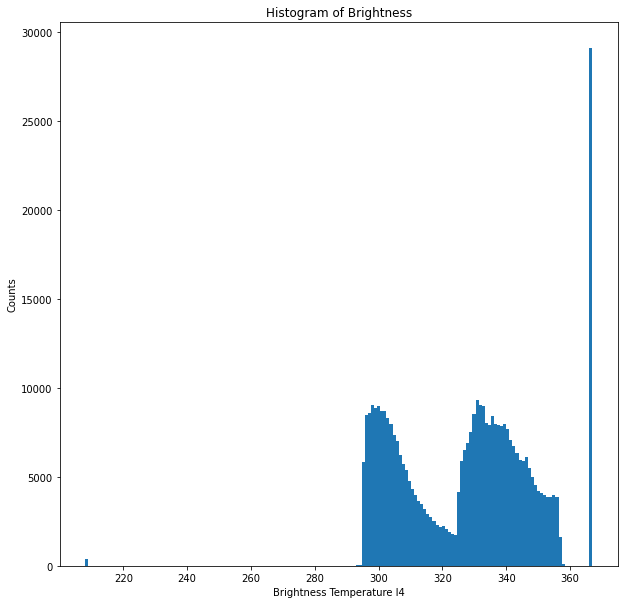

In [ ]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.hist(df_VIRRS.brightness,bins='auto');
ax.set_title("Histogram of Brightness");
ax.set_xlabel("Brightness Temperature I4");
ax.set_ylabel("Counts");

In [ ]:

geo_scat = px.scatter_geo(data_frame=df_modis,lat='latitude',lon='longitude',color='brightness',center = {"lat": np.mean(df_modis['latitude']), "lon": np.mean(df_modis['longitude'])},opacity=0.5,animation_frame='acq_date',title="Evolution of US wildfires intensity over time")
geo_scat.show()

# Selecting a Single day for Fire and drawing borders around it

In [ ]:
df_modis = pd.read_csv("fire_archive_M-C61_280974.csv")
df_VIRRS = pd.read_csv("fire_archive_SV-C2_280972.csv")

In [ ]:
len(df_modis)

102616

In [ ]:
df_modis_day1 = df_modis[df_modis['acq_date'].isin(["2013-01-12", "2013-01-13","2013-01-14","2013-01-15","2013-01-16"])]

In [ ]:
df_modis_day1.head

<bound method NDFrame.head of       latitude  longitude  brightness  scan  track    acq_date  acq_time  \
603    19.4090  -155.3014       305.9   3.0    1.7  2013-01-12       913   
604    19.4117  -155.2721       308.9   3.0    1.7  2013-01-12       913   
605    19.4092  -155.2960       312.8   3.0    1.7  2013-01-12       913   
606    19.3300  -155.0125       374.9   1.1    1.0  2013-01-12      1159   
607    19.3314  -155.0227       338.4   1.1    1.0  2013-01-12      1159   
...        ...        ...         ...   ...    ...         ...       ...   
1197   43.0286  -124.3374       325.4   1.6    1.3  2013-01-16      2056   
1198   43.0259  -124.3533       331.2   1.6    1.3  2013-01-16      2056   
1199   43.0300  -124.3332       317.3   1.6    1.3  2013-01-16      2056   
1200   19.4038  -155.2773       406.0   1.0    1.0  2013-01-16      2059   
1201   19.4052  -155.2868       381.9   1.0    1.0  2013-01-16      2059   

     satellite instrument  confidence  version  bright_t3

In [ ]:
df1 = df_modis_day1.sort_values(by = ['acq_date'],ascending = True)

fig = px.density_mapbox(df1, lon = 'longitude', lat = 'latitude',z = 'brightness', 
                        radius = 8,
                        center = dict(lon = -97,lat = 40),
                        zoom = 2.4,
                        mapbox_style='carto-positron',
                        color_continuous_scale = 'reds',
                        animation_frame = 'acq_date',
                        labels = {"acq_date":"Date"})

fig.update_layout(title = 'VIIRS | US Fires: From 2013-01-01 to 2013-12-31',
                  title_font = dict(size = 18,color = 'FireBrick'),
                  title_x = 0.5)

fig.show()

In [ ]:

geo_scat = px.scatter_geo(data_frame=df_modis_day1,lat='latitude',lon='longitude',color='brightness',center = {"lat": np.mean(df_modis['latitude']), "lon": np.mean(df_modis['longitude'])},opacity=0.5,animation_frame='acq_date',title="Evolution of US wildfires intensity over time")
geo_scat.show()

In [ ]:
df_modis_day1 = df_modis[df_modis["acq_date"] == "2013-01-12"]
df_virrs_day1 = df_VIRRS[df_VIRRS["acq_date"] == "2013-01-12"]

In [ ]:
print("length:",len(df_modis_day1),len(df_virrs_day1))

length: 95 281


In [ ]:
import math

meterModis = 1000
meterVIRRS = 0.375*1000

def addBordersForModis(df, isModis):
  arrLat = []
  arrLong = []
  for index, row in df.iterrows():
    lat = float(row ["latitude"]) 
    longi = float(row["longitude"])
    originLat = None
    origin_long = None

    if isModis:
      originLat, origin_long = getOriginForModis(lat,longi)
    else:
      originLat, origin_long = getOriginForVIRRUS(lat,longi)
    arrLat.append(originLat)
    arrLong.append(origin_long)
  return arrLat,arrLong
  
  return arr
def getOriginForModis(centerLat, centerLong):
  #radius of the earth in kilometer
  earth = 6378.137 
  pi = math.pi
  #1 meter in degree
  m = (1 / ((2 * pi / 360) * earth)) / 1000;
  new_latitude = centerLat - (meterModis * m)
  new_longitude = centerLong - (meterModis * m) / math.cos(centerLat * (pi / 180));
  return new_latitude,new_longitude


  '''coef = meterModis * 0.0000089
  new_lat = centerLat + coef;
  new_long = centerLong + coef / math.cos(new_lat * 0.018);
  return new_lat, new_long'''

def getOriginForVIRRUS(centerLat, centerLong):
  #radius of the earth in kilometer
  earth = 6378.137 
  pi = math.pi
  #1 meter in degree
  m = (1 / ((2 * pi / 360) * earth)) / 1000;
  new_latitude = centerLat - (meterVIRRS * m)
  new_longitude = centerLong - (meterVIRRS * m) / math.cos(centerLat * (pi / 180));
  return new_latitude,new_longitude




In [ ]:

df_modis_day1['origin_lat'],df_modis_day1['origin_long'] = addBordersForModis(df_modis_day1, True)
df_virrs_day1['origin_lat'],df_virrs_day1['origin_long'] = addBordersForModis(df_virrs_day1, False)

In [ ]:
import folium

# create a map object
mapObj = folium.Map(location=[-97, 40],
                    zoom_start=2)

# create a rectangle object and add to map
for index, row in df_modis_day1.iterrows():
  popup = """
    lat : <b>%s</b><br>
    long : <b>%s</b><br>
    confidence : <b>%s</b><br>
    """ % (row['latitude'], row['longitude'], row['confidence'])
  originlat, originlong = row["origin_lat"],row["origin_long"]
  lat = float(row ["latitude"]) 
  longi = float(row["longitude"])
  
  folium.Rectangle([(originlat,originlong), (lat,longi)],
                    color="green",
                    weight=2,
                   tooltip=popup,
                    fill=True,
                    fill_color="green",
                    fill_opacity=0.75).add_to(mapObj)

for index, row in df_virrs_day1.iterrows():
  popup = """
    lat : <b>%s</b><br>
    long : <b>%s</b><br>
    confidence : <b>%s</b><br>
    """ % (row['latitude'], row['longitude'], row['confidence'])
  originlat, originlong = row["origin_lat"],row["origin_long"]
  lat = float(row ["latitude"]) 
  longi = float(row["longitude"])
  
  folium.Rectangle([(originlat,originlong), (lat,longi)],
                    color="red",
                    weight=2,
                   tooltip=popup,
                    fill=True,
                    fill_color="red",
                    fill_opacity=0.75).add_to(mapObj)

In [ ]:
mapObj

# Plotting MODIS and VIIRS Grids



1.   find a location and see how fire data translate over the next few days
2.   Create overlays 



In [ ]:
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 5.0 MB/s 
     |████████████████████████████████| 16.7 MB 21.4 MB/s 
     |████████████████████████████████| 6.3 MB 47.1 MB/s 


In [ ]:
import folium
import math
import folium.plugins as folium_plugins
from shapely.geometry.polygon import Polygon
import geopandas as gpd


def getOriginForModis(centerLat, centerLong, direction):
  #radius of the earth in kilometer
  earth = 6378.137 
  pi = math.pi
  #1 meter in degree
  m = (1 / ((2 * pi / 360) * earth)) / 1000;
  new_latitude = centerLat + direction[0]*(10000 * m)
  new_longitude = centerLong +  direction[1]*((10000 * m) / math.cos(centerLat * (pi / 180))) 
  return new_latitude,new_longitude

arr = [[19.26, -155.47]]
directions = [[1,0],[0,-1],[0,1]]

f = arr[0][0]
l = arr[0][1]
df = 1000/69        
dl = df / math.cos(f) 
t= [[f-df,l-dl], [f+df,l-dl], [f+df,l+dl], [f-df,l+dl]] 

gridPolygon = []
p1 = Polygon([[19.26, -155.47], [19.553927536231882, -155.47], [19.553, -155.130], [19.264, -155.130]])
#p1 = Polygon(t)
gridPolygon.append(p1)


m = folium.Map(location=[33.7490, -84.3880], width=500, height=500,  zoom_start=5)

p1 = Polygon([[-84.688, 33.649],[-84.488, 33.449], [-84.488, 33.649]])
p2 = Polygon([[-84.488, 33.649], [-84.288, 33.649], [-84.288, 33.449], [-84.488, 33.449], [-84.488, 33.649]])
p3 = Polygon([[-84.288, 33.649], [-84.088, 33.649], [-84.088, 33.449], [-84.288, 33.449], [-84.288, 33.649]])

df_poly = gpd.GeoDataFrame(data={'geometry' : gridPolygon})
#df_poly.crs = 'EPSG:4326'

sd = {
    '0' : {'1617247390': {'color': '#0073CF', 'opacity': 0.5}},
    '1' : {'1618247390': {'color': '#0073CF', 'opacity': 0.5}},
    '2' : {'1619247390': {'color': '#0073CF', 'opacity': 0.5}}
}

folium.plugins.TimeSliderChoropleth(data=df_poly.to_json(), styledict=sd).add_to(m)

m

## 24 hours data

In [ ]:
import folium
import folium.plugins as folium_plugins
from shapely.geometry.polygon import Polygon
import geopandas as gpd


m = folium.Map(location=[19.364, -155.3490], width=500, height=500, zoom_start=10)

p1 = Polygon([[19.364, -155.349], [19.453, -155.253], [19.453, -155.349], [19.364, -155.349]])
p2 = Polygon([[19.366784235794025, -155.31972289683392], [19.456615764205974, -155.22447710316607], [19.456615764205974, -155.31972289683392], [19.366784235794025, -155.31972289683392]])
p3 = Polygon([[19.364284235794024, -155.34362216465505], [19.454115764205973, -155.24837783534494], [19.454115764205973, -155.34362216465505], [19.364284235794024, -155.34362216465505]])

df_poly = gpd.GeoDataFrame(data={'geometry' : [p1, p2, p3]})
#f_poly.crs = 'EPSG:4326'

sd = {
    '0' : {'1617247390': {'color': '#0073CF', 'opacity': 1.0}},
    '1' : {'1618247390': {'color': '#0073CF', 'opacity': 1.0}},
    '2' : {'1619247390': {'color': '#0073CF', 'opacity': 1.0}}
}

folium.plugins.TimeSliderChoropleth(data=df_poly.to_json(), styledict=sd).add_to(m)

m

In [ ]:
import math
import folium
import folium.plugins as folium_plugins
from shapely.geometry.polygon import Polygon
import geopandas as gpd
from datetime import datetime as dt
meterModis = 1000
meterVIRRS = 0.375*1000

dates = df_modis_day1.acq_date.unique()
years = []
for i in dates:
  date_time_obj = dt.strptime(i, '%Y-%m-%d')
  seconds_since_epoch = date_time_obj.timestamp()
  years.append(int(seconds_since_epoch))




directions = [[-1,-1],[1,1],[1,-1],[-1,-1]]

gridPositions = []
for index, row in df_modis_day1.iterrows():
  lat = float(row ["latitude"]) 
  longi = float(row["longitude"])
  f = lat
  l = longi
  df = 10/69        
  dl = df / math.cos(f) 
  t= [[l-dl,f-df], [l-dl,f+df], [l+dl,f+df], [l+dl,f-df]] 
  gridPositions.append(t)

gridPolygon = []

for n in gridPositions:
  p1 = Polygon(n)
  print(n)
  gridPolygon.append(p1)

m = folium.Map(location=[19.26, -155.47], prefer_canvas=True, width=500, height=500, zoom_start=10)
df_poly = gpd.GeoDataFrame(data={'geometry' : gridPolygon})
#df_poly.crs = 'EPSG:4326'

sd = {}
for index, item in enumerate(years):
  arr = {}
  style = {}
  style["color"] = "#ff4c30"
  style["opacity"] = 0.5
  arr[years[index]] = style
  sd[index] = arr


folium.plugins.TimeSliderChoropleth(data=df_poly.to_json(), styledict=sd).add_to(m)

m

In [ ]:
df_modis_day1 = pd.read_csv("MODIS_C6_1_USA_contiguous_and_Hawaii_24h.csv")
df_virrs_day1 = pd.read_csv("J1_VIIRS_C2_USA_contiguous_and_Hawaii_24h.csv")

In [ ]:
df_modis_day1.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,confidence,version,bright_t31,frp,daynight
0,18.87453,-92.63411,306.25,3.47,1.75,2022-07-20,338,T,43,6.1NRT,293.39,26.97,N
1,19.38964,-92.04313,316.35,3.06,1.66,2022-07-20,340,T,91,6.1NRT,292.47,63.38,N
2,19.38911,-92.04800,319.96,3.06,1.66,2022-07-20,340,T,99,6.1NRT,292.35,80.15,N
3,30.94371,-88.01272,308.25,1.07,1.03,2022-07-20,342,T,70,6.1NRT,295.20,6.27,N
4,31.15104,-87.98985,309.65,1.06,1.03,2022-07-20,342,T,75,6.1NRT,295.67,7.18,N


In [ ]:
df_virrs_j1 = pd.read_csv("J1_VIIRS_C2_USA_contiguous_and_Hawaii_24h.csv")
df_virrs_suomi = pd.read_csv("SUOMI_VIIRS_C2_USA_contiguous_and_Hawaii_24h.csv")

In [ ]:
frames = [df_virrs_j1, df_virrs_suomi]
  
df_virrs_day1 = pd.concat(frames)

In [ ]:
df_virrs_day1.head()

In [ ]:
df_modis_day1.head()

# Building Multi-residual U-Net for Super resolution


## Installing libraries

In [ ]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached argparse-1.4.0-py2.py3-none-any.whl (23 kB)


## Downloading Data for Specific Years

In [ ]:
python modis_download.py -I -r -t h18v03,h18v04 -f 2008-01-01 -e 2008-01-31 lst_terra/

In [ ]:
!python modis_data_preprocessing.py

start to processing MODIS/MOD_2000_MOD11A1/hdfs_files
Using 0.0000s to process product = MOD11A1.061
start to processing MODIS/MOD_2000_MOD13A2/hdfs_files
Using 0.0000s to process product = MOD13A2.061
start to processing MODIS/MOD_2001_MOD11A1/hdfs_files
Using 0.0000s to process product = MOD11A1.061
start to processing MODIS/MOD_2001_MOD13A2/hdfs_files
Using 0.0000s to process product = MOD13A2.061
start to processing MODIS/MOD_2002_MOD11A1/hdfs_files
Using 0.0000s to process product = MOD11A1.061
start to processing MODIS/MOD_2002_MOD13A2/hdfs_files
Using 0.0000s to process product = MOD13A2.061
start to processing MODIS/MOD_2003_MOD11A1/hdfs_files
Using 0.0000s to process product = MOD11A1.061
start to processing MODIS/MOD_2003_MOD13A2/hdfs_files
Using 0.0000s to process product = MOD13A2.061
start to processing MODIS/MOD_2004_MOD11A1/hdfs_files
Using 0.0000s to process product = MOD11A1.061
start to processing MODIS/MOD_2004_MOD13A2/hdfs_files
Using 0.0000s to process product = MO

## Creating Model

In [ ]:
!python train.py --datapath /content/MODIS/MOD_2020_MOD11A1/tifs_files/1km/ --model_name lovesummer --lr 0.001 --epochs 300 --batch_size 32 --continue_train False

Finished processing tif files in 0.002 minutes 

Max pixel value of training set is 287.0400085449219,
IMPORTANT: Please save it for later used as the normalization factor

Finished processing data in additional 0.019 minutes 

Length of training set: 152 

Length of validating set: 26 

Shape of input and output: (64,64) 

Epoch 1 of 300
5it [01:09, 13.91s/it]
1it [00:03,  3.34s/it]
train.py:142: RuntimeWarning: divide by zero encountered in double_scalars
  final_psnr = running_psnr/int(len(val_data)/dataloader.batch_size)
train.py:143: RuntimeWarning: divide by zero encountered in double_scalars
  final_ssim = running_ssim/int(len(val_data)/dataloader.batch_size)
Train loss: 439.014883
Val loss: 0.638356
Save model...
Epoch 2 of 300
5it [01:07, 13.60s/it]
1it [00:03,  3.38s/it]
Train loss: 21.197020
Val loss: 1.645539
Epoch 3 of 300
5it [01:06, 13.24s/it]
1it [00:03,  3.29s/it]
Train loss: 11.173182
Val loss: 3.489934
Epoch 4 of 300
5it [01:06, 13.37s/it]
1it [00:03,  3.31s/it]
Trai

In [ ]:
!zip -r /content/sample_data.zip /content/

updating: content/ (stored 0%)
updating: content/.config/ (stored 0%)
updating: content/.config/.last_survey_prompt.yaml (stored 0%)
updating: content/.config/configurations/ (stored 0%)
updating: content/.config/configurations/config_default (deflated 15%)
updating: content/.config/config_sentinel (stored 0%)
updating: content/.config/.last_opt_in_prompt.yaml (stored 0%)
updating: content/.config/logs/ (stored 0%)
updating: content/.config/logs/2022.07.13/ (stored 0%)
updating: content/.config/logs/2022.07.13/13.42.53.841315.log (deflated 54%)
updating: content/.config/logs/2022.07.13/13.42.53.106562.log (deflated 54%)
updating: content/.config/logs/2022.07.13/13.42.32.441281.log (deflated 54%)
updating: content/.config/logs/2022.07.13/13.42.25.014838.log (deflated 86%)
updating: content/.config/logs/2022.07.13/13.42.05.105178.log (deflated 54%)
updating: content/.config/logs/2022.07.13/13.41.43.930690.log (deflated 91%)
updating: content/.config/active_config (stored 0%)
updating: co